# 2D plotting of LES output vs. satellite imagery (work in progress)
* The below notebook compares selected simulations against observational targets that were collected from satellite and ground-based retrievals.
* In case of questions or concerns, please notify Ann Fridlind (ann.fridlind@nasa.gov), Timothy Juliano (tjuliano@ucar.edu), and Florian Tornow (ft2544@columbia.edu).

In [11]:
import glob, os
import geopy
import geopy.distance
 
os.getcwd()

'/data/project/comble-mip/satellite_imagery/viirs'

In [2]:
os.chdir("/user-data-home/comble-mip/notebooks/plotting/")

%run functions_plotting.py 
%run function_plotting_2d.py 

## read trajectory
ds = nc.Dataset('../../data_files/theta_temp_rh_sh_uvw_sst_along_trajectory_era5ml_28h_end_2020-03-13-18.nc')
les_time = 18. + ds['Time'][:]
    
## select simulations to plot
sim_keyword = 'FixN_2'  

In [3]:
## select times
#Time_Vec = [0.,1.,2.,6.,10.,14.,18.] ## hours, where 18 h marks arrival
Time_Vec = [0.,1.,2.,3.,4.,5.,6.,7.,8.,9.,10.,11.,12.,13.,14.,15.,16.,17.,18.] ## hours, where 18 h marks arrival

## select acceptable window of time
Time_Window = 15.0  ## hours

## set domain to be extracted
Spat_Window = 200.0 ## km

## downscale to 1 km resolution (default: True)
upscale = True

## repeat small domain output to match large domain (default: False)
tiling = False 


In [4]:
## convert to regular time
tprop = []
for toi in Time_Vec:
    tprop.append(np.datetime64('2020-03-13T00:00:00') + np.timedelta64(int(toi),'h'))
           

In [5]:
## load all simulations located in subfolders of the given directory

os.chdir("/user-data-home/comble-mip/notebooks/plotting/")
%run functions_plotting.py 

var_vec_2d = ['alb','opt']

if upscale:
    df_col_2d = load_sims_2d('/data/project/comble-mip/output_les/',var_vec_2d,t_shift=-2,keyword=sim_keyword,times=[t for t in Time_Vec if t > 0],coarsen=False)
    df_col_2d['x'] = np.round(df_col_2d['x']/1000,1)
    df_col_2d['y'] = np.round(df_col_2d['y']/1000,1)
    df_col_2d = df_col_2d.rename({'y':'y_round','x':'x_round'})
else:
    df_col_2d = load_sims_2d('/data/project/comble-mip/output_les/',var_vec_2d,t_shift=-2,keyword=sim_keyword,times=[t for t in Time_Vec if t > 0],coarsen=True)

Loading variables: f(time,x,y)
/data/project/comble-mip/output_les/wrf/WRF_Lx25_dx100_FixN_2D.nc


ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


NaN values in alb
NaN values in opt
/data/project/comble-mip/output_les/scale-sdm/scale-sn14_Lx25_dx100_FixN_2d.nc
...adjusting x and y values
/data/project/comble-mip/output_les/dharma/DHARMA_Lx125_dx100_FixN_2D.nc
/data/project/comble-mip/output_les/dharma/DHARMA_Lx25_dx100_FixN_2D.nc
/data/project/comble-mip/output_les/uclales-salsa/UCLALES-SALSA_Lx25_dx100_FixN_2D.nc
...adjusting x and y values


In [6]:
## for small domain simulations, repeat 2D output to match large domain (so-called "tiling")

for si in range(len(df_col_2d['Source'])):
    print(df_col_2d['Source'].data[si])
    x_act = df_col_2d.isel(Source=si).dropna(dim='x_round',how='all')['x_round'].data
    print(x_act.max())
    if x_act.max() > 50:  ## nothing to be done, simply copy
        df_sim = df_col_2d.isel(Source=si).drop_vars('Source').copy()
    else:                 ## tile
        for ti in range(len(df_col_2d['time'])):
            df_core = df_col_2d.isel(Source=si).isel(time=ti).sel(x_round=slice(min(x_act),max(x_act))).sel(y_round=slice(min(x_act),max(x_act))).drop_vars(['time','Source'])
                    
            count = 0
            for xri in range(-2,3):        
                df_copy = df_core.copy()
                df_copy['x_round'] = np.round(df_core['x_round'] + xri*len(x_act)/10,1)
                
                if count == 0:
                    df_sim_tiled = df_copy.copy()
                else:
                    df_sim_tiled = xr.concat([df_sim_tiled,df_copy],dim='x_round',coords='all')
                count += 1
                
            count = 0
            for yri in range(-2,3):   
                df_copy = df_sim_tiled.copy()
                df_copy['y_round'] = np.round(df_core['y_round'] + yri*len(x_act)/10,1)
                    
                if count == 0:
                    df_sim_tiled_2 = df_copy.copy()
                else:
                    df_sim_tiled_2 = xr.concat([df_sim_tiled_2,df_copy],dim='y_round',coords='all')
                count += 1
                
            df_sim_tiled_2['time'] = df_col_2d['time'].data[ti]
            df_sim_tiled_2 = xr.concat([df_sim_tiled_2],dim='time',coords='all')
            if ti == 0:
                df_sim_tcol = df_sim_tiled_2.copy()
            else:
                df_sim_tcol = xr.concat([df_sim_tcol,df_sim_tiled_2],dim='time',coords='all')
                
        df_sim = df_sim_tcol.copy()

    df_sim['Source'] = df_col_2d['Source'].data[si]
    df_sim = xr.concat([df_sim],dim='Source',coords='all')
    if si == 0:
        df_sim_scol = df_sim.copy()
    else:
        df_sim_scol = xr.concat([df_sim_scol,df_sim],dim='Source',coords='all')
        
if tiling:
    df_col_2d = df_sim_scol.copy()

wrf/WRF_Lx25_dx100_FixN_2D.nc
12.7
scale-sdm/scale-sn14_Lx25_dx100_FixN_2d.nc
12.7
dharma/DHARMA_Lx125_dx100_FixN_2D.nc
63.9
dharma/DHARMA_Lx25_dx100_FixN_2D.nc
12.7
uclales-salsa/UCLALES-SALSA_Lx25_dx100_FixN_2D.nc
12.7


In [7]:
## load satellite imagery

os.chdir("/data/project/comble-mip/satellite_imagery/viirs/")
counter_dat = 0
for file in glob.glob("*03DNB*.nc"):
    
    ## load geolocation    
    ds_geo = nc.Dataset("/data/project/comble-mip/satellite_imagery/viirs/" + file)
    
    ## load imagery
    file_sp = file.split('.')    
    file_img = glob.glob(file_sp[0].replace('3','2')+'.'+file_sp[1]+'.'+file_sp[2]+'*')[0]
    ds_img = nc.Dataset("/data/project/comble-mip/satellite_imagery/viirs/" + file_img)
    
    ## time
    file_time = np.datetime64('2020-01-01') + np.timedelta64(int(file_sp[1][5:8])-1,'D') + np.timedelta64(int(file_sp[2][0:2]),'h')+ np.timedelta64(int(file_sp[2][2:4]),'m')
    
    print(file)
    print(file_img)    
    
    ## for each requested model timestep, check if image covers right place at right time
    counter_time = 0
    for Time_OI in tprop:
        diff_time = (file_time - np.datetime64(Time_OI))/np.timedelta64(1, 's')/3600
        if np.abs(diff_time) <= Time_Window:
            print(Time_OI)
            Traj_time = (Time_OI - np.datetime64('2020-03-13T18:00:00'))/np.timedelta64(1, 's')/3600
            Lat_OI = ds['Latitude'][ds['Time'][:]==Traj_time][0]
            Lon_OI = ds['Longitude'][ds['Time'][:]==Traj_time][0]
            
            ## create spatial window around coordinate of interest
            start = geopy.Point(Lat_OI, Lon_OI)
            d = geopy.distance.distance(kilometers=1.2*Spat_Window/2)
            
            LAT_MIN = d.destination(point=start, bearing=180)[0]
            LAT_MAX = d.destination(point=start, bearing=0)[0]
            LON_MIN = d.destination(point=start, bearing=270)[1]
            LON_MAX = d.destination(point=start, bearing=90)[1]
            
            ## select pixels within window
            pix_num = ((ds_geo['geolocation_data/latitude'][:] > LAT_MIN) & 
                       (ds_geo['geolocation_data/latitude'][:] < LAT_MAX) & 
                       (ds_geo['geolocation_data/longitude'][:] > LON_MIN)& 
                       (ds_geo['geolocation_data/longitude'][:] < LON_MAX)).sum()
            print(pix_num)
            
            if pix_num > 0:
                
                ds_sub = ds_img['observation_data/DNB_observations'][:,:][(ds_geo['geolocation_data/latitude'][:] > LAT_MIN) & 
                                                                          (ds_geo['geolocation_data/latitude'][:] < LAT_MAX) & 
                                                                          (ds_geo['geolocation_data/longitude'][:] > LON_MIN)& 
                                                                          (ds_geo['geolocation_data/longitude'][:] < LON_MAX)]
                ds_lat = ds_geo['geolocation_data/latitude'][:,:][(ds_geo['geolocation_data/latitude'][:] > LAT_MIN) & 
                                                                  (ds_geo['geolocation_data/latitude'][:] < LAT_MAX) & 
                                                                  (ds_geo['geolocation_data/longitude'][:] > LON_MIN)& 
                                                                  (ds_geo['geolocation_data/longitude'][:] < LON_MAX)]
                ds_lon = ds_geo['geolocation_data/longitude'][:,:][(ds_geo['geolocation_data/latitude'][:] > LAT_MIN) & 
                                                                   (ds_geo['geolocation_data/latitude'][:] < LAT_MAX) & 
                                                                   (ds_geo['geolocation_data/longitude'][:] > LON_MIN)& 
                                                                   (ds_geo['geolocation_data/longitude'][:] < LON_MAX)]
                da = xr.DataArray(
                    name = 'alb',
                    data = ds_sub,
                    dims = ['pixel'],
                    coords = dict(
                        lon = (['pixel'],ds_lon),
                        lat = (['pixel'],ds_lat)
                    ))
            
                ## compute meridional and latitudal distance to center
                da['x_dist'] = 0*da['lat']
                da['y_dist'] = 0*da['lat']
                for ii in range(len(ds_sub)):
                    da['x_dist'][ii] = geopy.distance.geodesic((da['lat'][ii],da['lon'][ii]), 
                                                               (da['lat'][ii],Lon_OI)).km * np.sign((da['lon'][ii].data - Lon_OI))
                    da['y_dist'][ii] = geopy.distance.geodesic((da['lat'][ii],da['lon'][ii]), 
                                                               (Lat_OI,da['lon'][ii])).km * np.sign((da['lat'][ii].data - Lat_OI)) 
                
                ## limit to requested size
                da = da[np.abs(da['x_dist']) <= Spat_Window/2]
                da = da[np.abs(da['y_dist']) <= Spat_Window/2]
                
                ## normalize radiance values to resemble LES pseudo-albedo
                ## (using quantiles to avoid dominance of few bright pixels)
                fact = 0.9
                if Time_OI in df_col_2d['time']:
                    fact = df_col_2d['alb'].sel(time=Time_OI).quantile(q=0.8).data
                da.data = ((da.data - da.data.min())/(da.quantile(q=0.8).data - da.data.min()))*fact
                    
                da['x_round'] = np.round(da['x_dist'])
                da['y_round'] = np.round(da['y_dist'])
                
                for yy in np.unique(da['y_round']):
                    da_sub = da[da['y_round'] == yy]
                    da_stat = da_sub.groupby('x_round').mean() 
                    da_stat['y_round'] = np.float64(yy)
                    if yy == np.unique(da['y_round'])[0]:
                        da_stat_stack = xr.concat([da_stat],dim='y_round')
                    else:
                        da_stat_stack = xr.concat([da_stat_stack,da_stat],dim='y_round')
                    
                if upscale:
                    x_round_new = np.round(np.linspace(da_stat_stack.x_round[0], da_stat_stack.x_round[-1], 10*len(da_stat_stack['x_round'])-9),1) # da_stat_stack["x_round"] * 4)
                    y_round_new = np.round(np.linspace(da_stat_stack.y_round[0], da_stat_stack.y_round[-1], 10*len(da_stat_stack['y_round'])-9),1) # da_stat_stack["x_round"] * 4)
                    da_stat_stack = da_stat_stack.interp(x_round=x_round_new,y_round=y_round_new)
                                        
                da_stat_stack['time'] = Time_OI
                da_stat_stack['time_diff'] = diff_time
                if counter_time == 0:
                    da_stat_stst = xr.concat([da_stat_stack],dim='time')
                else:
                    da_stat_stst = xr.concat([da_stat_stst,da_stat_stack],dim='time')
                counter_time += 1
                
    da_stat_stst['Source'] = file_sp[0]+'.'+file_sp[1]+'.'+file_sp[2]
    if counter_dat == 0:
        da_stat_ststst = xr.concat([da_stat_stst],dim='Source')
    else:
        da_stat_ststst = xr.concat([da_stat_ststst,da_stat_stst],dim='Source')
    counter_dat += 1


VNP03DNB.A2020073.1306.002.2021125004801.nc
VNP02DNB.A2020073.1306.002.2021126174604.nc
2020-03-13T00:00:00
102832
2020-03-13T01:00:00
102628
2020-03-13T02:00:00
102677
2020-03-13T03:00:00
102795
2020-03-13T04:00:00
102699
2020-03-13T05:00:00
102503
2020-03-13T06:00:00
92600
2020-03-13T07:00:00
61993
2020-03-13T08:00:00
33141
2020-03-13T09:00:00
6332
2020-03-13T10:00:00
0
2020-03-13T11:00:00
0
2020-03-13T12:00:00
0
2020-03-13T13:00:00
0
2020-03-13T14:00:00
0
2020-03-13T15:00:00
0
2020-03-13T16:00:00
0
2020-03-13T17:00:00
0
2020-03-13T18:00:00
0
VJ103DNB.A2020073.1212.002.2020073175644.nc
VJ102DNB.A2020073.1212.002.2020073182754.nc
2020-03-13T00:00:00
101606
2020-03-13T01:00:00
104534
2020-03-13T02:00:00
104596
2020-03-13T03:00:00
104610
2020-03-13T04:00:00
104670
2020-03-13T05:00:00
104702
2020-03-13T06:00:00
104740
2020-03-13T07:00:00
104729
2020-03-13T08:00:00
104763
2020-03-13T09:00:00
104789
2020-03-13T10:00:00
104837
2020-03-13T11:00:00
104876
2020-03-13T12:00:00
104870
2020-03-13

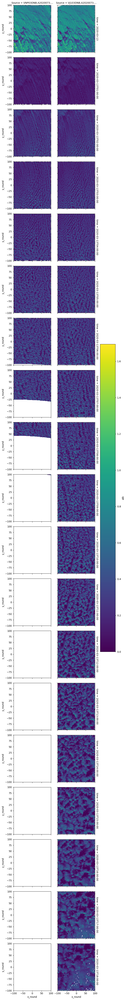

In [9]:
da_stat_ststst.plot(row='time',col='Source')

/tmp/ipykernel_525/2479718957.py:1: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  xr.merge([df_col_2d['alb'],da_stat_ststst.drop('time_diff')])['alb'].plot(x='x_round',y='y_round',row='time',col='Source',robust=True)


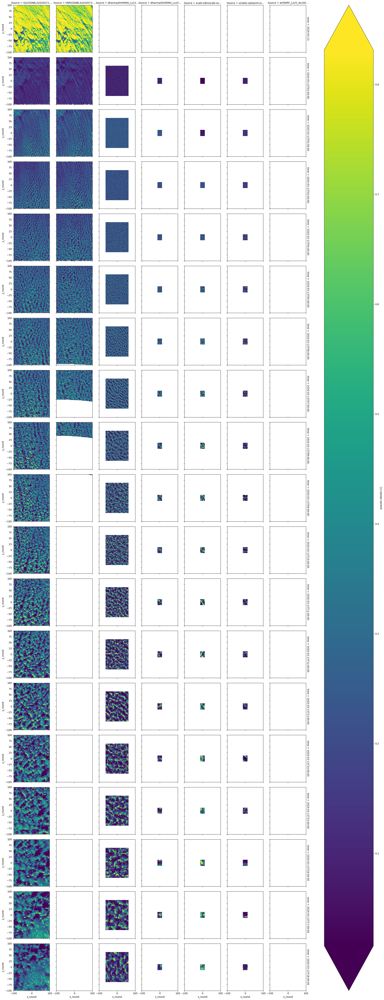

In [10]:
xr.merge([df_col_2d['alb'],da_stat_ststst.drop_vars('time_diff')])['alb'].plot(x='x_round',y='y_round',row='time',col='Source',robust=True)

In [81]:
## create wind speed variable
df_col_2d['ws'] = np.sqrt(df_col_2d['us']**2 + df_col_2d['vs']**2)


In [108]:
## remove domain mean
for si in range(len(df_col_2d['Source'])):
    for ti in range(len(df_col_2d['time'])):
        df_core = df_col_2d.isel(Source=si).isel(time=ti).drop_vars(['time','Source'])
        df_core['ws_res'] = df_core['ws'] - df_core['ws'].mean()
        df_core['time'] = df_col_2d['time'].data[ti]
        df_core = xr.concat([df_core],dim='time',coords='all')
        if ti == 0:
            df_sim_tcol = df_core.copy()
        else:
            df_sim_tcol = xr.concat([df_sim_tcol,df_core],dim='time',coords='all')
                
    df_sim = df_sim_tcol.copy()

    df_sim['Source'] = df_col_2d['Source'].data[si]
    df_sim = xr.concat([df_sim],dim='Source',coords='all')
    if si == 0:
        df_sim_scol = df_sim.copy()
    else:
        df_sim_scol = xr.concat([df_sim_scol,df_sim],dim='Source',coords='all')
        

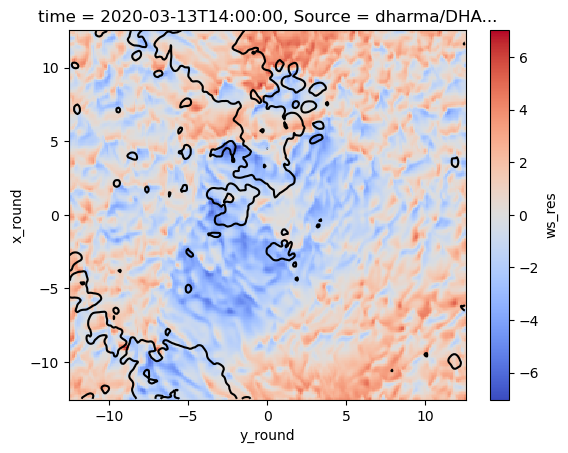

In [111]:
## Successful example of two layers
df_sim_scol.isel(Source=2).isel(time=4)['ws_res'].sel(x_round=slice(-12.5,12.5)).sel(y_round=slice(-12.5,12.5)).plot(cmap='coolwarm')
df_sim_scol.isel(Source=2).isel(time=4)['opt'].sel(x_round=slice(-12.5,12.5)).sel(y_round=slice(-12.5,12.5)).plot.contour(levels=1,vmin=10,vmax=10,cmap='black')

ValueError: DataArray must be 2d

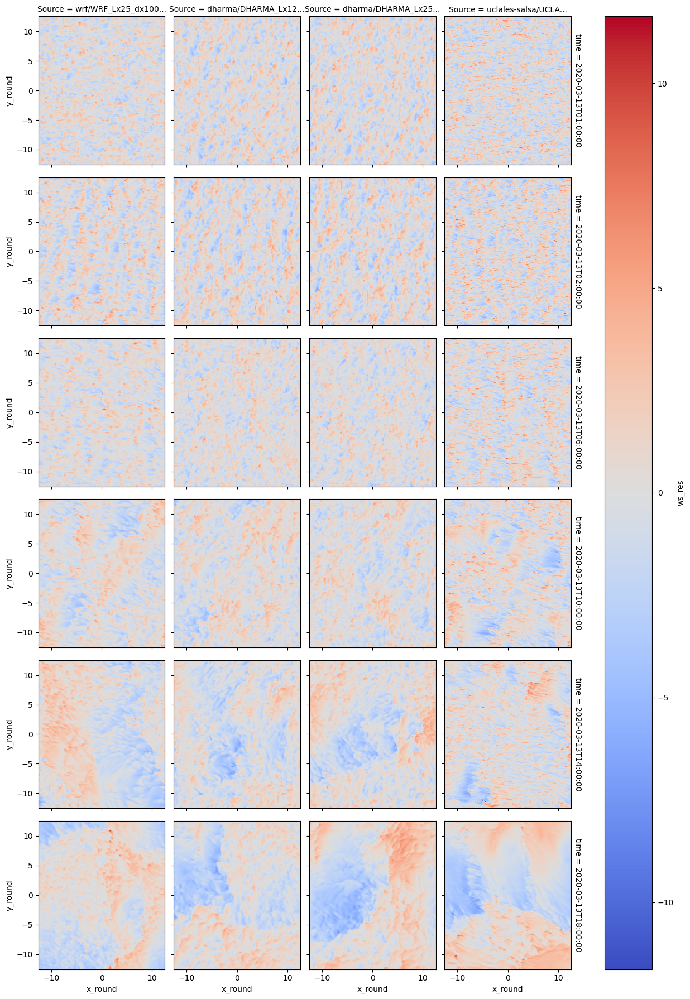

In [115]:
## Somehow two layers won't work for faceting
plot = df_sim_scol['ws_res'].sel(x_round=slice(-12.5,12.5)).sel(y_round=slice(-12.5,12.5)).plot(x='x_round',y='y_round',col='Source',row='time',cmap='coolwarm')
plot = df_sim_scol['opt'].sel(x_round=slice(-12.5,12.5)).sel(y_round=slice(-12.5,12.5)).plot.contour(levels=1,vmin=10,vmax=10,cmap='black')

In [ ]:
import os, sys, tarfile
from pathlib import Path
import netCDF4 as nc
from numpy import *
import matplotlib.pyplot as plt
import glob
import pandas as pd
## test to apply clustering algorithm ###

## certain properties
RES_ORG = 0.1
RES_CLA = 1.0

## use both obs and LES
df_col_2d_tot = xr.merge([df_col_2d,da_stat_ststst.drop_vars('time_diff')])

## certain thresholds
counter = 0
for ss in [2,3]:
    print(df_col_2d_tot.isel(Source=ss)['Source'].data)
    print('-----')
    tt_vec = len(df_col_2d_tot.isel(Source=ss)['time'])
    for tt in range(4,tt_vec):
        pseudo_alb = df_col_2d_tot['alb'].isel(time=tt).isel(Source=ss).data
        pseudo_alb[np.isnan(pseudo_alb)] = 0

        #if 'opt' in df_col_2d_tot.isel(Source=ss).keys():
        if sum(np.isnan(df_col_2d_tot.isel(Source=ss)['opt']) == 0):
            pseudo_alb  = df_col_2d_tot['alb'].isel(time=tt).isel(Source=ss).sel(x_round=slice(np.min(df_col_2d['x_round']),np.max(df_col_2d['x_round']))).sel(y_round=slice(np.min(df_col_2d['y_round']),np.max(df_col_2d['y_round']))).data
            opd_cloud  = df_col_2d_tot['opt'].isel(time=tt).isel(Source=ss).sel(x_round=slice(np.min(df_col_2d['x_round']),np.max(df_col_2d['x_round']))).sel(y_round=slice(np.min(df_col_2d['y_round']),np.max(df_col_2d['y_round']))).data
            
            THRES_CONNECT = np.nanquantile(pseudo_alb[(opd_cloud) > 2.0],0.50)
            THRES_CLOUD   = np.nanquantile(pseudo_alb[(opd_cloud) > 2.0],0.50)
        else:
            print('here!')
            THRES_CONNECT = np.nanquantile(pseudo_alb,0.50)
            THRES_CLOUD   = np.nanquantile(pseudo_alb,0.50)
        print(THRES_CONNECT)
        print(THRES_CLOUD)
        
        if sum(pseudo_alb > THRES_CLOUD) > 1:
            CLUST_COORDS = id_watershed(pseudo_alb,THRES_CLOUD,THRES_CONNECT,plotting=True)
            CLUST_GEOM = cluster_geometry(CLUST_COORDS,total=[(shape(pseudo_alb)[0]*shape(pseudo_alb)[1])])
            CLUST_GEOM['time']   = df_col_2d_tot.isel(time=tt).isel(Source=ss)['time'].data
            CLUST_GEOM['Source'] = df_col_2d_tot.isel(time=tt).isel(Source=ss)['Source'].data
            print(CLUST_GEOM)
            if counter == 0:
                CLUST_GEOM_COL = pd.concat([CLUST_GEOM])
            else:
                CLUST_GEOM_COL = pd.concat([CLUST_GEOM_COL,CLUST_GEOM])
            counter +=1
    
## coarsen field
#var_coarse = coarsen_2d(pseudo_alb,RES_CLA=RES_CLA,RES_ORG=RES_ORG)
#nx_coa = var_coarse.shape[0]


#plt.imshow(df_col_2d['alb'].isel(time=3).isel(Source=1).data)

In [ ]:
CLUST_GEOM_COL

In [ ]:
cluster_geometry(CLUST_COORDS,total=[(shape(pseudo_alb)[0]*shape(pseudo_alb)[1])])

In [ ]:
CLUST_GEOM_COL['time_conv'] = (pd.to_datetime(CLUST_GEOM_COL['time']) - pd.to_datetime('2020-03-12 22:00:00')).astype('timedelta64[h]')

In [ ]:
#p#lt.hist(CLUST_GEOM_COL['area'],label=CLUST_GEOM_COL['Source'])

CLUST_GEOM_COL.groupby('Source')['area'].hist(alpha=0.75)

In [ ]:
CLUST_STAT_1 = CLUST_GEOM_COL.groupby(['Source','time_conv'])['area'].size()
CLUST_STAT_2 = CLUST_GEOM_COL.groupby(['Source','time_conv'])['area'].max()

In [ ]:
CLUST_STAT_1

In [ ]:
for name,j in CLUST_STAT_1.groupby('Source'):
    j[name].plot(title='Number of Cells',xlabel='Time since 2020-03-12 22:00 (hours)',ylabel='Number of Cells',label=name,legend=True)

In [ ]:
for name,j in CLUST_STAT_2.groupby('Source'):
    j[name].plot(title='Maximum Cell Size',xlabel='Time since 2020-03-12 22:00 (hours)',ylabel='Cell Size',label=name,legend=True)

In [ ]:
CLUST_GEOM_COL['Clust'] = CLUST_GEOM_COL.index 

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3)
for ax, col in zip(axes.flat, CLUST_GEOM_COL.groupby(['Source','time_conv'])):
    print(col[0][0])
    model = col[0][0][0:7]
    time = col[0][1]
    ax.pie(col[1]['area'],labels=col[1].index,autopct='%.1f',)
    ax.set(ylabel=model, title=time, aspect='equal')



In [ ]:

fig, ax = plt.subplots(1, 6, figsize=(10,8))
ax = iter(ax)
for s, g in CLUST_GEOM_COL.groupby(['Source']):
    for t, f in g.groupby(['time']):
        #print(f)
        f.set_index('Clust')['area'].plot.pie(ax=next(ax),  autopct='%.1f', title=f'{s}')

In [ ]:

fig, ax = plt.subplots(1, 2, figsize=(10,8))
ax = iter(ax)
for t, g in CLUST_GEOM_COL.groupby(['Source']):
    g.set_index('Clust').groupby('time')['area'].plot.pie(ax=next(ax),  autopct='%.1f', title=f'{t}')

In [ ]:

CLUST_COORDS_BIG = CLUST_COORDS.copy()


CLUST_COORDS_BIG['x'] = (CLUST_COORDS['x']*RES_CLA/RES_ORG) + (RES_CLA/RES_ORG - 1)/2
CLUST_COORDS_BIG['y'] = (CLUST_COORDS['y']*RES_CLA/RES_ORG) + (RES_CLA/RES_ORG - 1)/2

    
CLUST_GEOM = cluster_geometry(CLUST_COORDS_BIG,total=[(shape(pseudo_alb)[0]*shape(pseudo_alb)[1])])
CLUST_GEOM['time'] = 1
pd.concat([CLUST_GEOM,CLUST_GEOM])

In [ ]:
plt.scatter(CLUST_GEOM.index,CLUST_GEOM.area)

In [ ]:

## select simulations to plot
sim_keyword = 'DHARMA_Lx25_dx100_FixN_2D' #UCLALES-SALSA_Lx25_dx100_FixN_2D'  

os.chdir("/user-data-home/comble-mip/notebooks/plotting/")
%run functions_plotting.py 

## load all simulations located in subfolders of the given directory
df_col_2d = load_sims_2d('/data/project/comble-mip/output_les/',var_vec_2d,t_shift=-2,keyword=sim_keyword,times=[t for t in Time_Vec if t > 0],coarsen=True)
var_vec_2d = ['olr11']

df_col_2d['olr11'].plot(row='time',col_wrap=7,col='Source')

In [ ]:
df_col_2d['olr11'].isel(time=0)